In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt
import random
import math

# 1.Cargado de la data y escalado

In [ ]:
urls = ["https://los40.cl/wp-content/uploads/2022/05/cheems-baltze-1-768x432.jpg",
        "https://placekitten.com/800/571"
       ]  

images=[]
gray_images=[]

a=768
b=432


for url in urls:
  image = io.imread(url)
  res_img=cv.resize(image, (a,b),interpolation = cv.INTER_AREA )
  images.append(cv.cvtColor(res_img, cv.COLOR_BGR2RGB))
  gray_images.append(cv.cvtColor(res_img, cv.COLOR_BGR2GRAY))

In [ ]:
for i in gray_images:
  print(str(i.shape[0])+" "+str(i.shape[1]))

432 768
432 768


se usaran imagenes a blanco y negro, dado que el procedimiento es el mismo en los 3 canales.

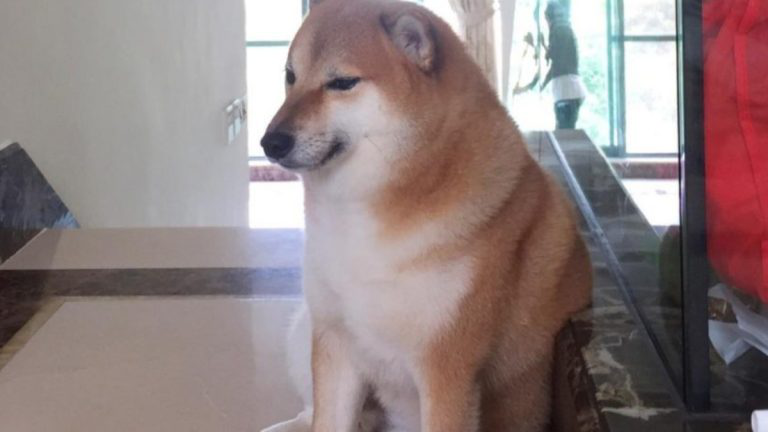

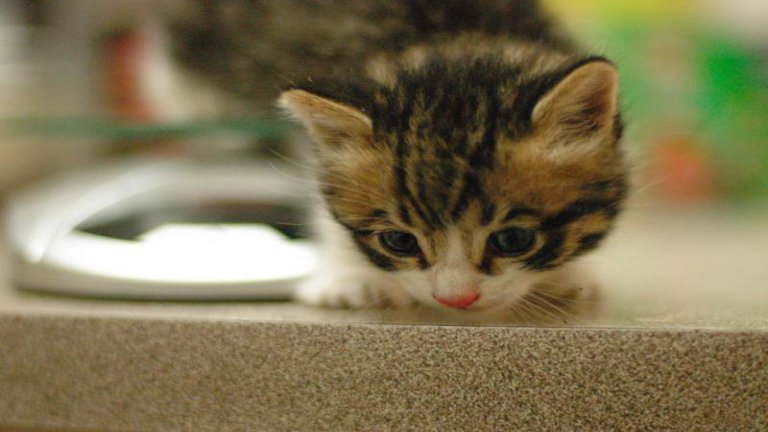

In [ ]:
for i in images:
  cv2_imshow(i)
  print('\n')

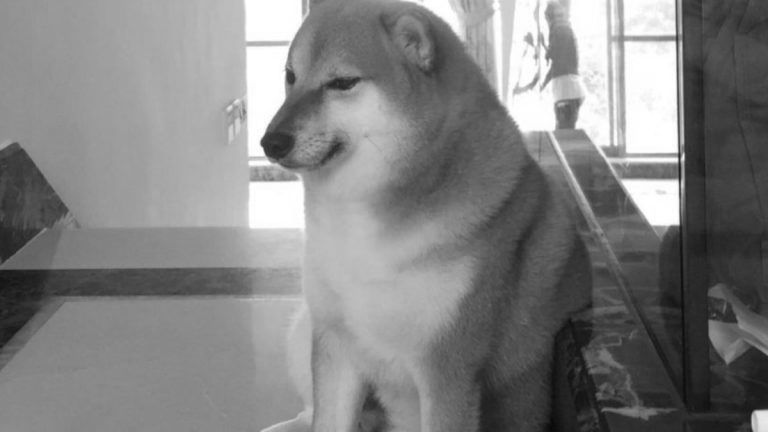

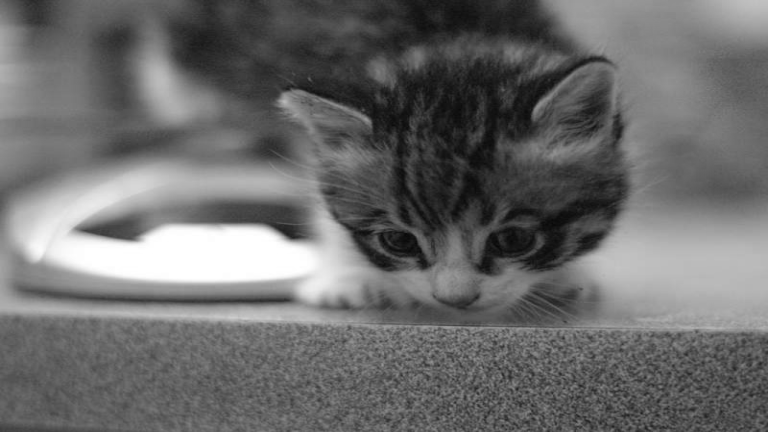

In [ ]:
for i in gray_images:
  cv2_imshow(i)
  print('\n')

# 2. Calculo de Histograma

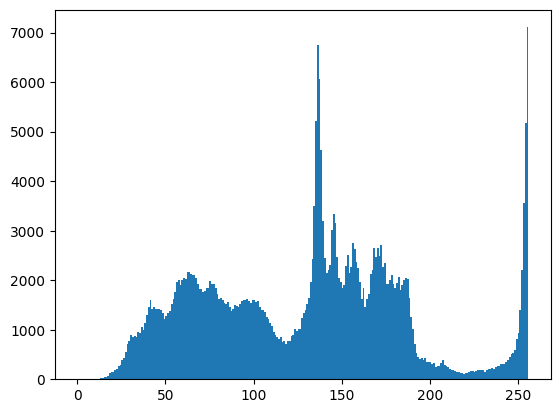

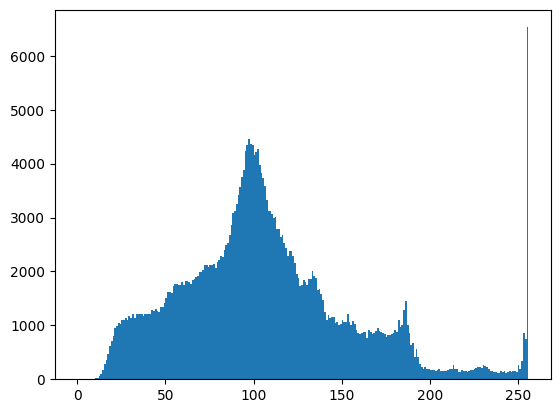

In [ ]:
#Usando la libreria
for i in gray_images:
  plt.hist(i.ravel(),bins = 256, range = [0,256]) 
  plt.show()

In [ ]:
base=[]
for i in range(256):
  base.append(i)

In [ ]:
#De manera manual
histogramas=[]
for i in gray_images:
  aux=np.zeros(256)
  for j in range(i.shape[0]):
    for k in range(i.shape[1]):
      aux[i[j][k]]=aux[i[j][k]]+1
  histogramas.append(aux)

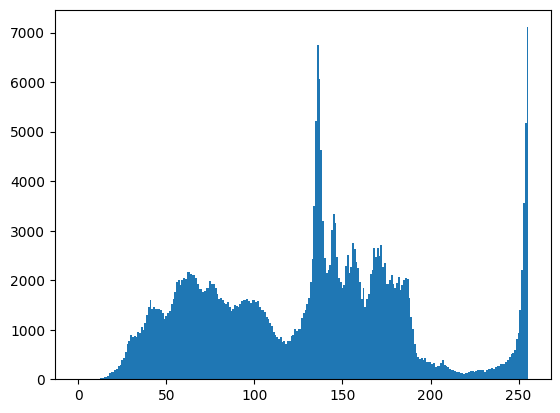

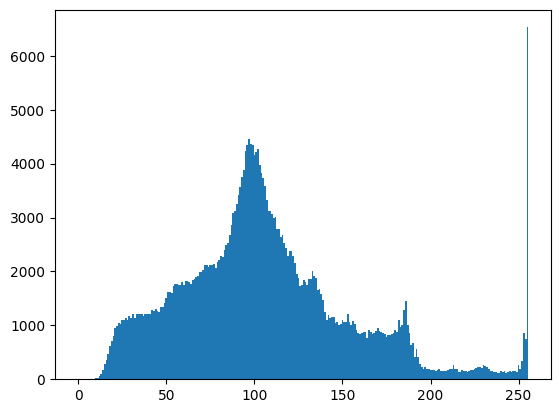

In [ ]:
for i in histogramas:
  plt.bar(base, i, width = 1)
  plt.show()

## 2.1 Equalizacion Histograma

In [ ]:
npu=a*b
for i in histogramas:
  aux=i[0]
  for j in range(1,255):
    aux2=aux
    aux=aux+i[j]
    i[j]=aux2*255/npu
  i[255]=255

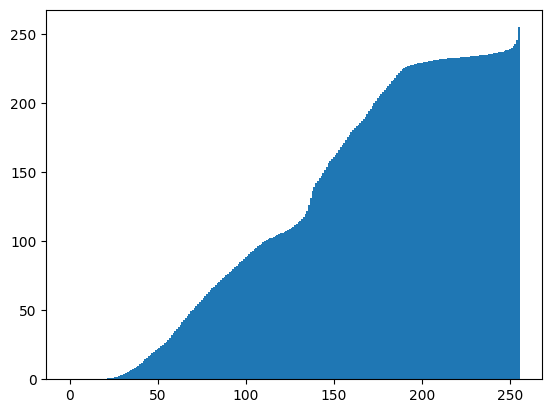

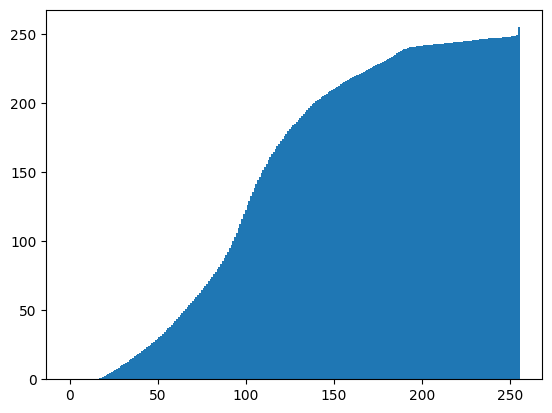

In [ ]:
for i in histogramas:
  plt.bar(base, i, width = 1)
  plt.show()

In [ ]:
#Funcion de equalizacion de histogramas manualmente
def Equalization(imagen):
    p=np.zeros(256)
    s=np.zeros(256)
    modificado=imagen.copy()
    
    for i in range(len(imagen)):
        for j in range(len(imagen[i])):
            p[imagen[i][j]]=p[imagen[i][j]]+1
            
    for i in range(len(s)):
        P=0
        for j in range(i+1):
             P=P+p[j]
        s[i]=math.floor((256-1)*P/(len(imagen)*len(imagen[i])))
        
    for i in range(len(imagen)):
        for j in range(len(imagen[i])):
            modificado[i][j]=s[imagen[i][j]]

    return modificado

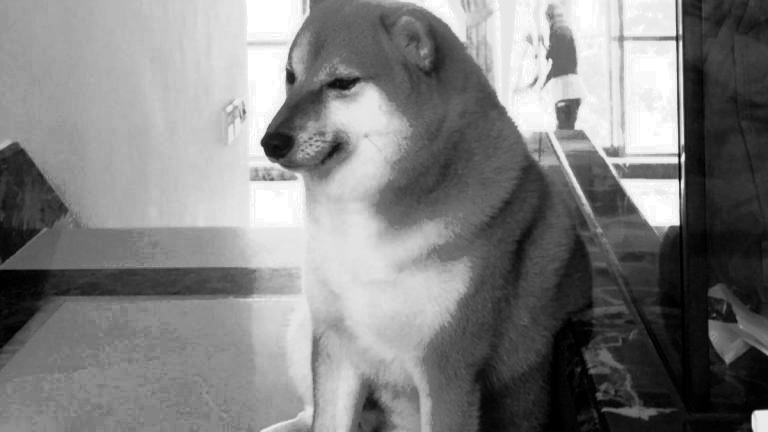

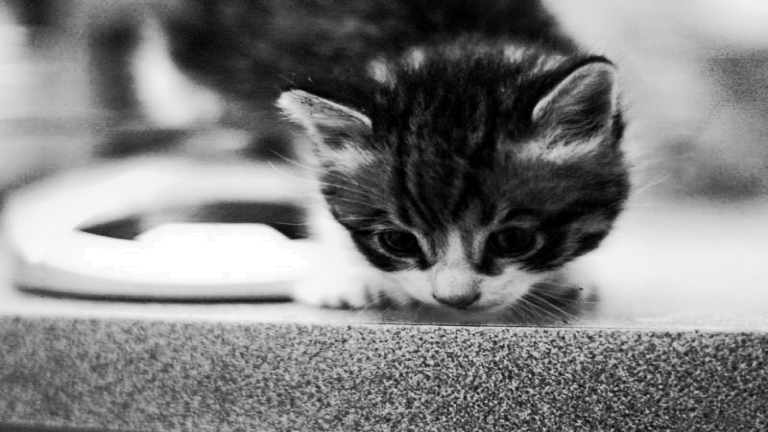

In [ ]:
for i in gray_images:
  dst=Equalization(i)
  cv2_imshow(dst)
  print('\n')

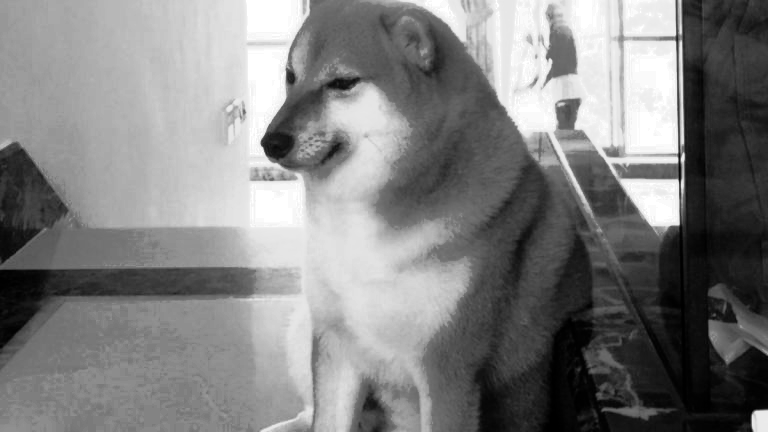

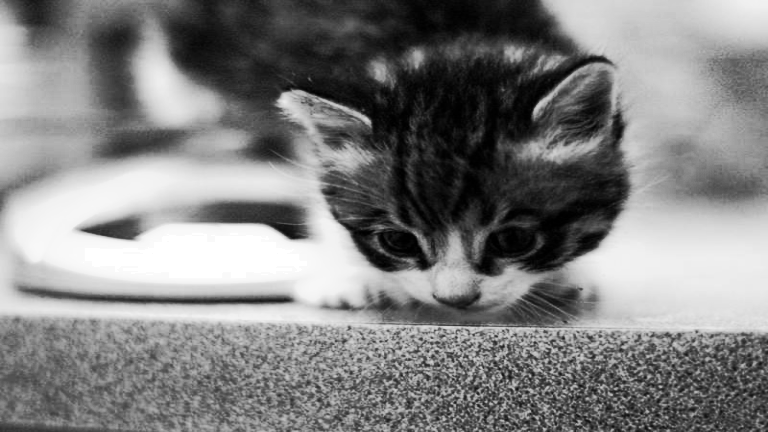

In [ ]:
#Usando la libreria
for i in gray_images:
  dst=equalized = cv.equalizeHist(i)
  cv2_imshow(dst)
  print('\n')

# 3. Operaciones Algebraicas
## 3.1. Suma

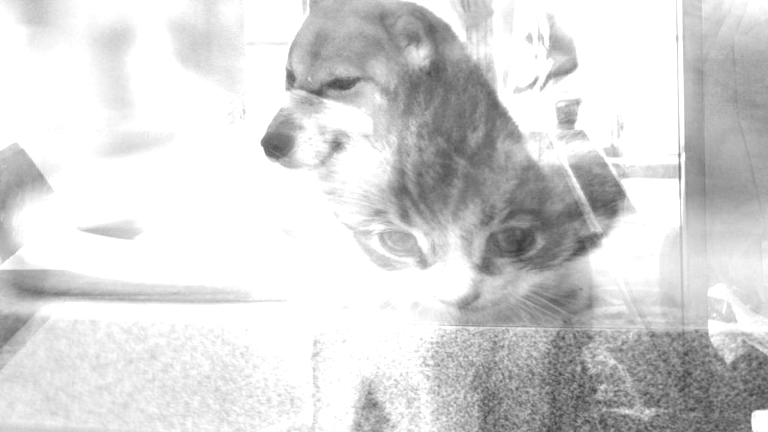

In [ ]:
# de manera Manual
suma = np.zeros((b,a), dtype=np.uint8)

for j in range(b):
  for k in range(a):
    aux=0.0+gray_images[0][j][k]+gray_images[1][j][k]
    if aux>255:
      aux=255
    suma[j][k]=aux

cv2_imshow(suma)

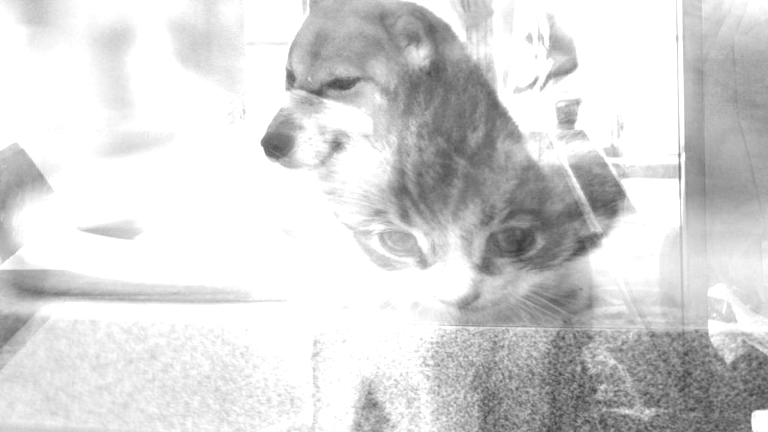

In [ ]:
#con la libreria
cv2_imshow(cv.add(gray_images[0],gray_images[1]))

##3.2. Resta

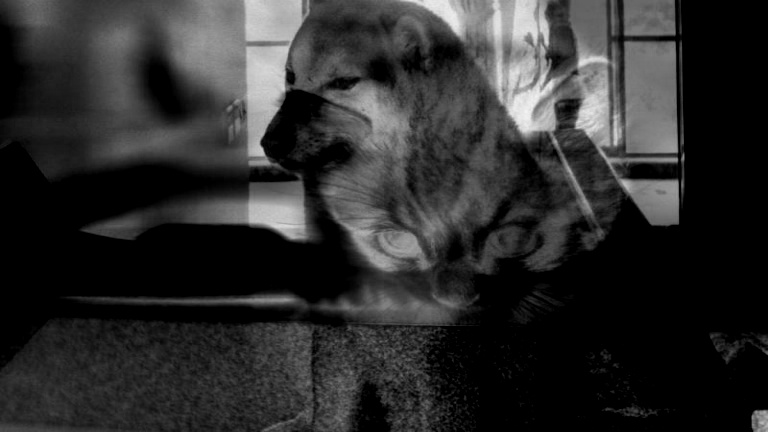

In [ ]:
#de manera manual
resta = np.zeros((b,a), dtype=np.uint8)

for j in range(b):
  for k in range(a):
    aux=0.0+gray_images[0][j][k]-gray_images[1][j][k]
    if(aux<0):
      aux=0.0
    resta[j][k]=aux

cv2_imshow(resta)

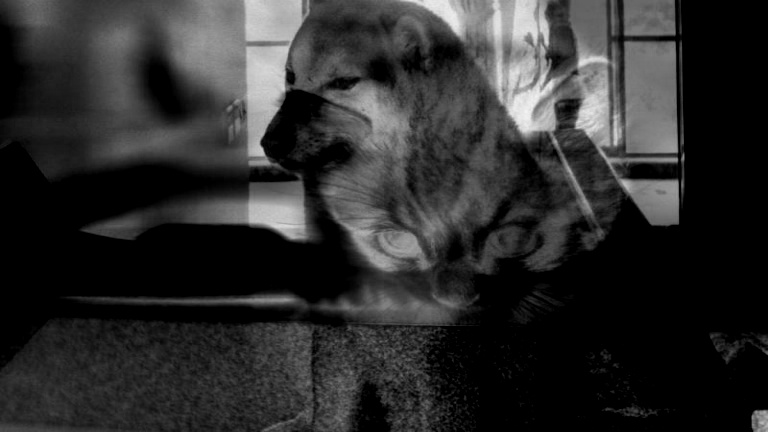

In [ ]:
#usando la libreria
cv2_imshow(cv.subtract(gray_images[0],gray_images[1]))

##3.3. Promedio

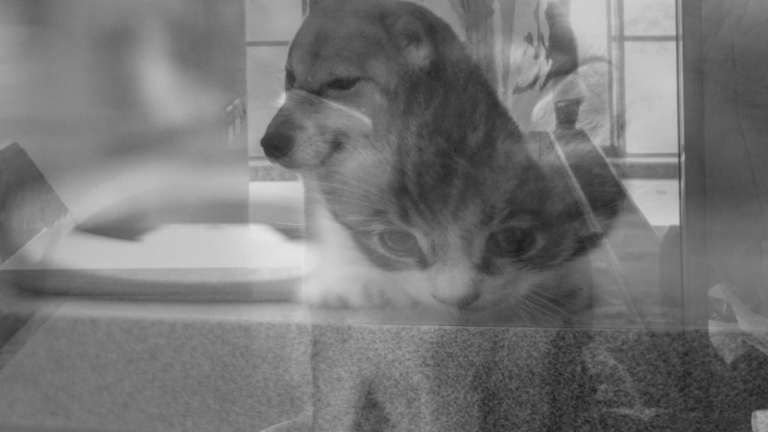

In [ ]:
# de manera manual
promedio = np.zeros((b,a), dtype=np.uint8)

for j in range(b):
  for k in range(a):
    promedio[j][k]=gray_images[0][j][k]/2+gray_images[1][j][k]/2

cv2_imshow(promedio)

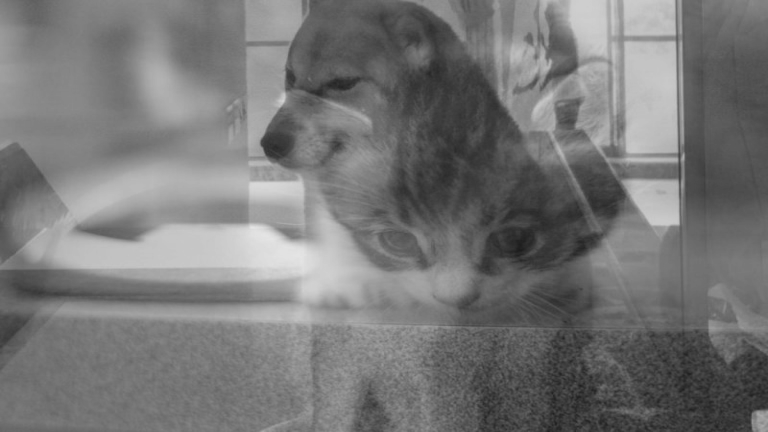

In [ ]:
#usando la libreria
cv2_imshow(cv.addWeighted(gray_images[0],0.5,gray_images[1],0.5,0))

## 3.4. Suma Ponderada

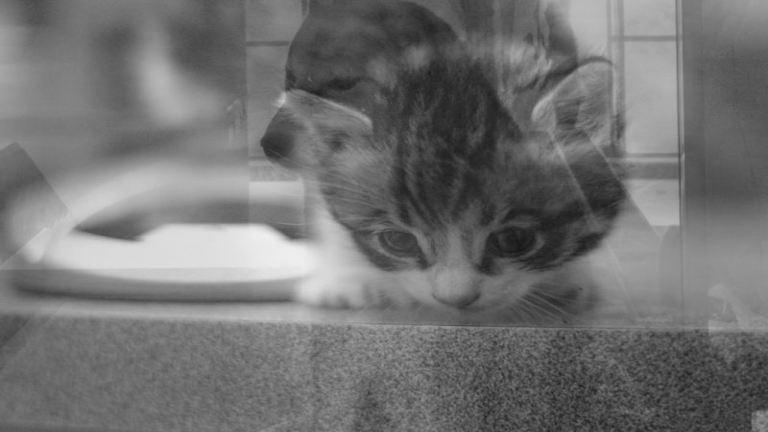

In [ ]:
#de manera manual
peso1=0.30
peso2=1-peso1

ponderado = np.zeros((b,a), dtype=np.uint8)

for j in range(b):
  for k in range(a):
    ponderado[j][k]=(gray_images[0][j][k]*peso1+peso2*gray_images[1][j][k])

cv2_imshow(ponderado)

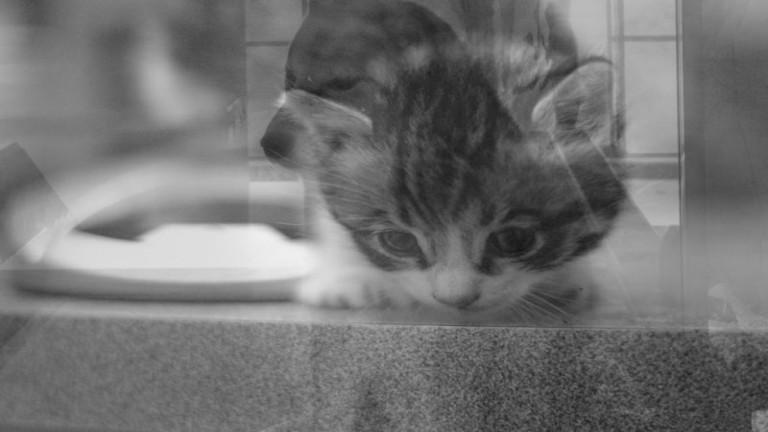

In [ ]:
#usando la libreria
cv2_imshow(cv.addWeighted(gray_images[0],peso1,gray_images[1],peso2,0))

##3.5. Multiplicacion

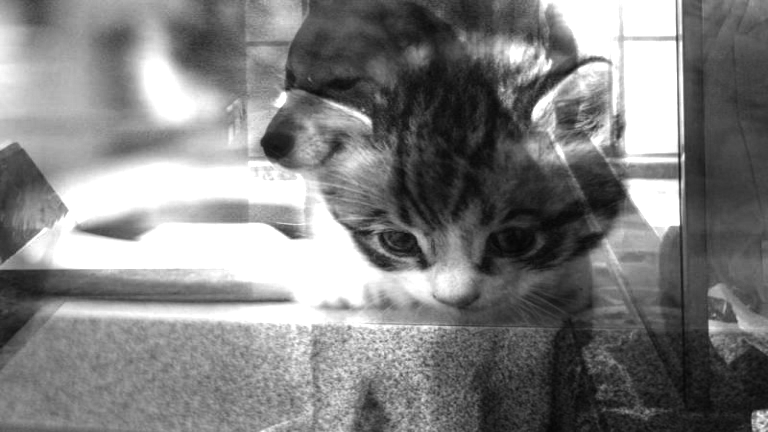

In [ ]:
C=0.01

multiplicacion = np.zeros((b,a), dtype=np.uint8)

for j in range(b):
  for k in range(a):
    aux=(1.00*gray_images[0][j][k]*gray_images[1][j][k]*C)
    if aux>255:
      aux=255
    multiplicacion[j][k]=aux

cv2_imshow(multiplicacion)

## 4. Filtro Sobel Bordes

In [ ]:
# de manera manual
def filtro_bordes(kernelX,kernelY,img):
    img2=img.copy()
    n_ker=kernelX.shape[0]
    ini=int(n_ker/2)
    
    for i in range(ini,len(img)-ini):
        for j in range(ini,len(img[0])-ini):
            #Proceso en X
            aux=0
            for ii in range(n_ker):
                for jj in range(n_ker):
                    aux=aux+kernelX[ii,jj]*img[i-ini+ii,j-ini+jj]
            #Proceso en Y
            aux2=0
            for ii in range(n_ker):
                for jj in range(n_ker):
                    aux2=aux2+kernelY[ii,jj]*img[i-ini+ii,j-ini+jj]
            img2[i,j]=(aux**2+aux2**2)**(1/2)
    return img2

In [ ]:
#INPUT
kernelX = np.array([
  [-1,0,1],
  [-2,0,2],
  [-1,0,1]
])

kernelY = np.array([
  [-1,-2,-1],
  [0,0,0],
  [1,2,1]
])

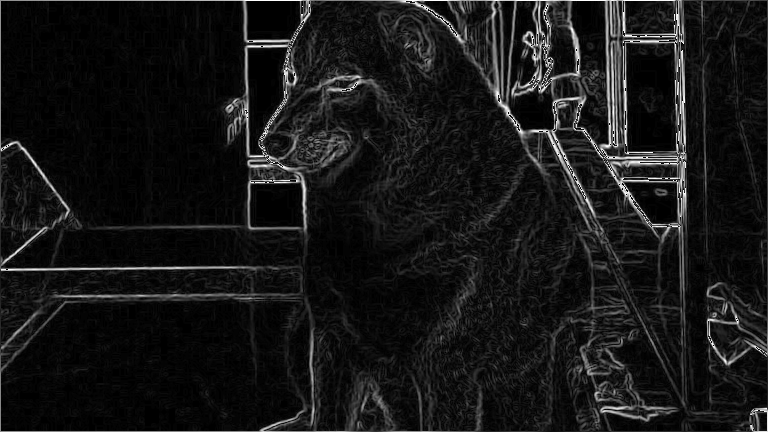

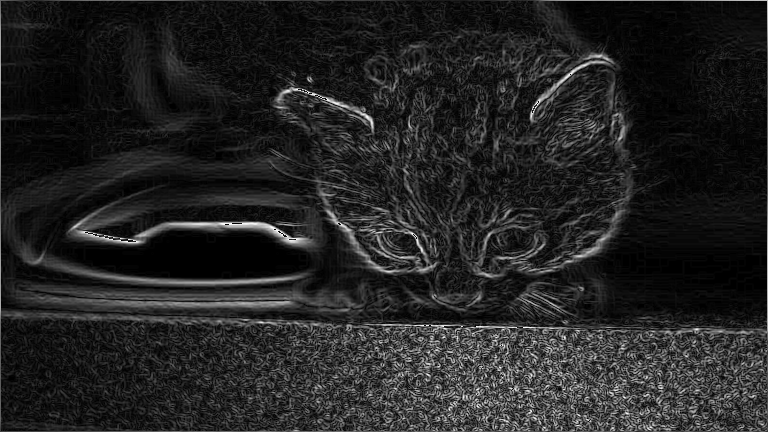

In [ ]:
for i in gray_images:
  dst=filtro_bordes(kernelX,kernelY,i)
  cv2_imshow(dst)
  print('\n')

# 5. Convolucion

In [ ]:
#INPUT
kernel = np.array([
  [-1/9,-1/9,-1/9],
  [-1/9,-1/9,-1/9],
  [-1/9,-1/9,-1/9]
])

In [ ]:
#de manera manual
def Convolucion(kernel,img):
    img2=img.copy()
    n_ker=kernel.shape[0]
    ini=int(n_ker/2)
    
    for i in range(ini,len(img)-ini):
        for j in range(ini,len(img[0])-ini):
            aux=0
            for ii in range(n_ker):
                for jj in range(n_ker):
                    aux=aux+kernel[ii,jj]*img[i-ini+ii,j-ini+jj]

            img2[i,j]=aux
    return img2

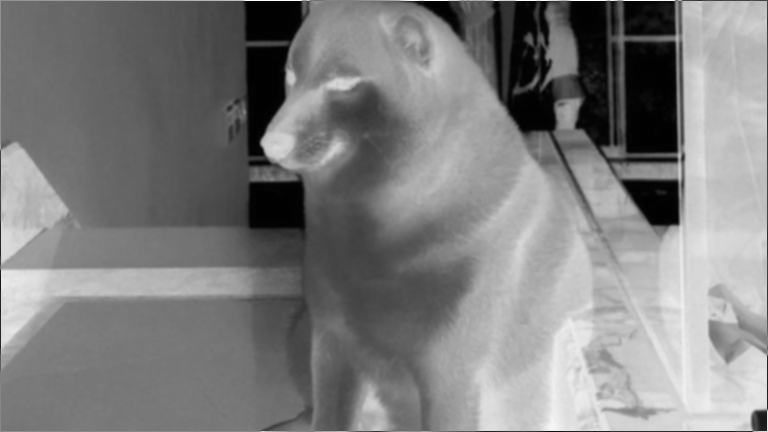

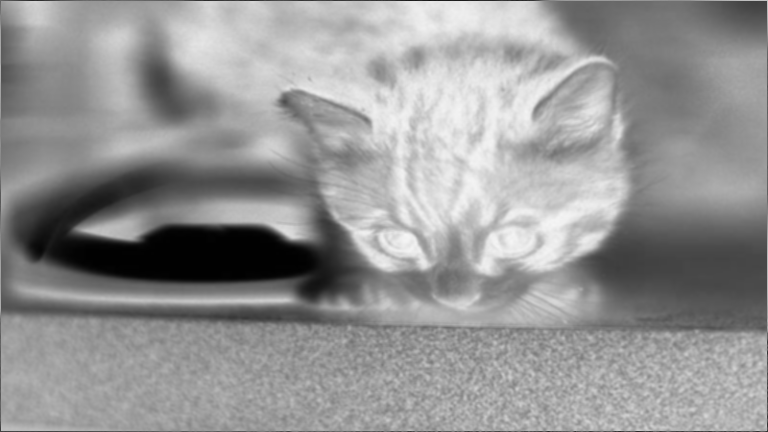

In [ ]:
for i in gray_images:
  dst=Convolucion(kernel,i)
  cv2_imshow(dst)
  print('\n')

# 6. Preparado de la imagen con ruido

In [ ]:
def add_noise(img):
    img2=img.copy()
    row , col = img2.shape
    number_of_pixels = random.randint(300, 10000)
    for i in range(number_of_pixels):
        y_coord=random.randint(0, row - 1)
        x_coord=random.randint(0, col - 1)
        img2[y_coord][x_coord] = 255

    number_of_pixels = random.randint(300 , 10000)
    for i in range(number_of_pixels):
        y_coord=random.randint(0, row - 1)
        x_coord=random.randint(0, col - 1)
        img2[y_coord][x_coord] = 0
          
    return img2

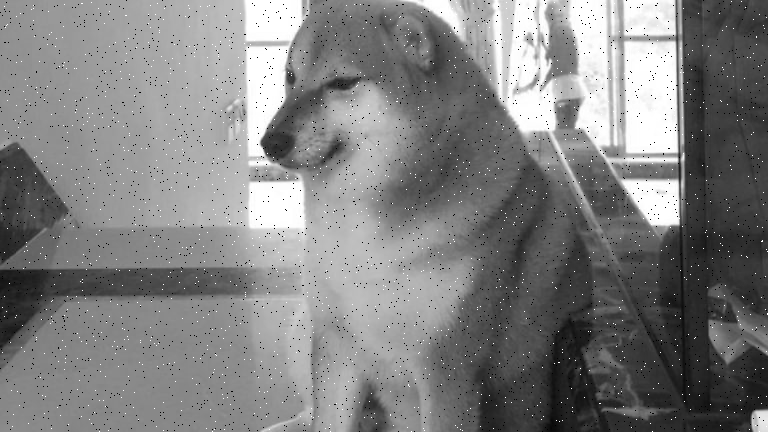

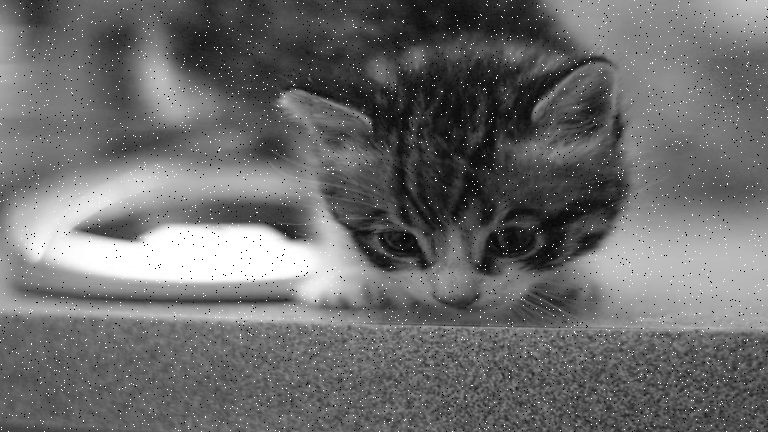

In [ ]:
saltpepper=[]
for i in gray_images:
  aux=add_noise(i)
  saltpepper.append(aux)
  cv2_imshow(aux)
  print('\n')

# 7. Filtro Mediana

In [ ]:
n_ker=5

In [ ]:
def Mediana(n_ker,img):
    img2=img.copy()
    ini=int(n_ker/2)
    
    for i in range(ini,len(img)-ini):
        for j in range(ini,len(img[0])-ini):
            aux=[]
            for ii in range(n_ker):
                for jj in range(n_ker):
                    aux.append(img[i-ini+ii,j-ini+jj])
            img2[i,j]=np.median(aux)
    return img2

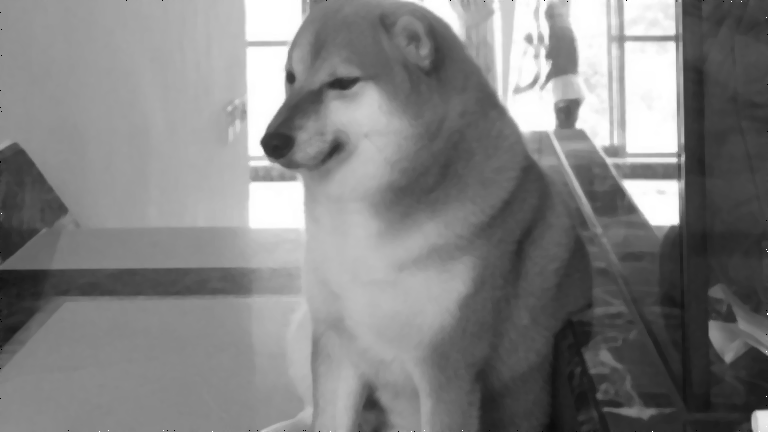

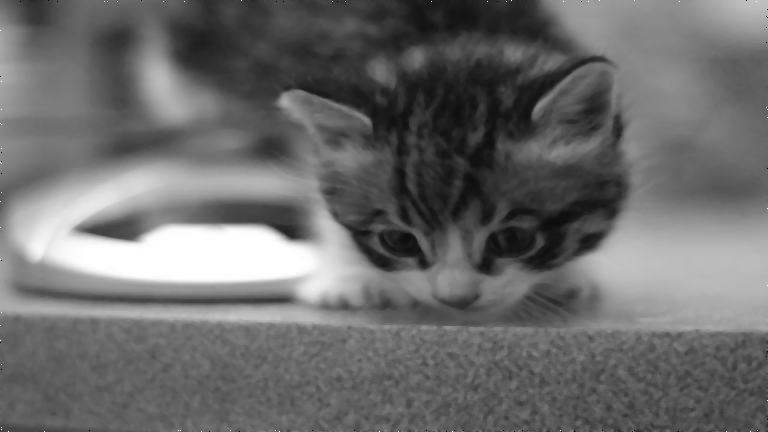

In [ ]:
for i in saltpepper:
  dst=Mediana(n_ker,i)
  cv2_imshow(dst)
  print('\n')

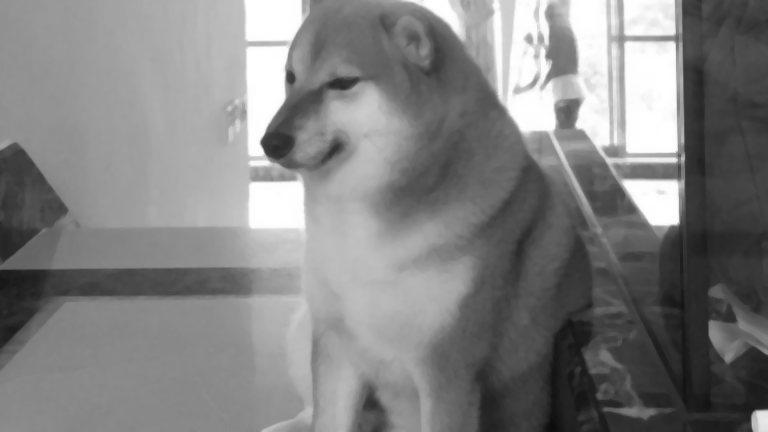

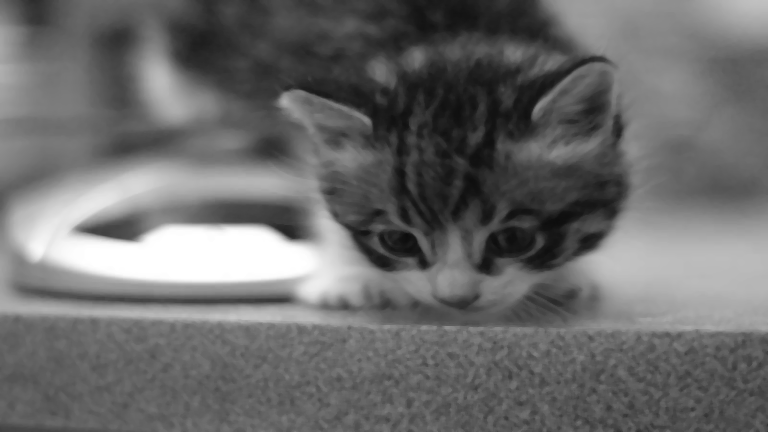

In [ ]:
#con las librerias
for i in gray_images:
  dst=cv.medianBlur(i,n_ker)
  cv2_imshow(dst)
  print('\n')

# 8. Filtro Gauss

In [ ]:
#INPUT
kernel = np.array([
  [1/16,2/16,1/16],
  [2/16,4/16,2/16],
  [1/16,2/16,1/16]
])

In [ ]:
def Gauss(kernel,img):
    img2=img.copy()
    n_ker=kernel.shape[0]
    ini=int(n_ker/2)
    
    for i in range(ini,len(img)-ini):
        for j in range(ini,len(img[0])-ini):
            aux=0
            for ii in range(n_ker):
                for jj in range(n_ker):
                    aux=aux+kernel[ii,jj]*img[i-ini+ii,j-ini+jj]

            img2[i,j]=aux
    return img2

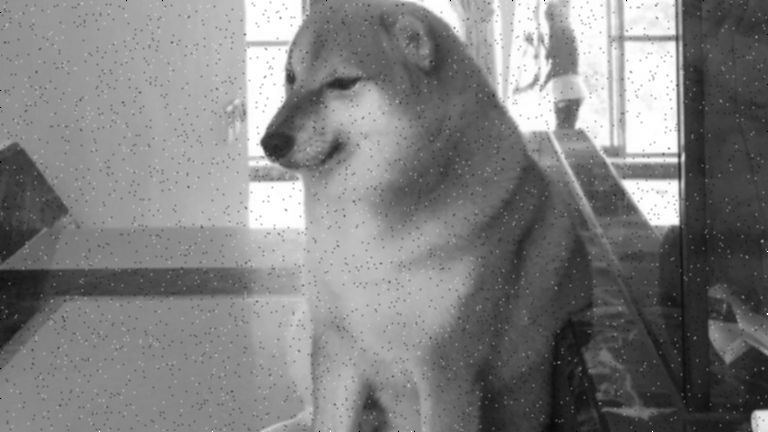

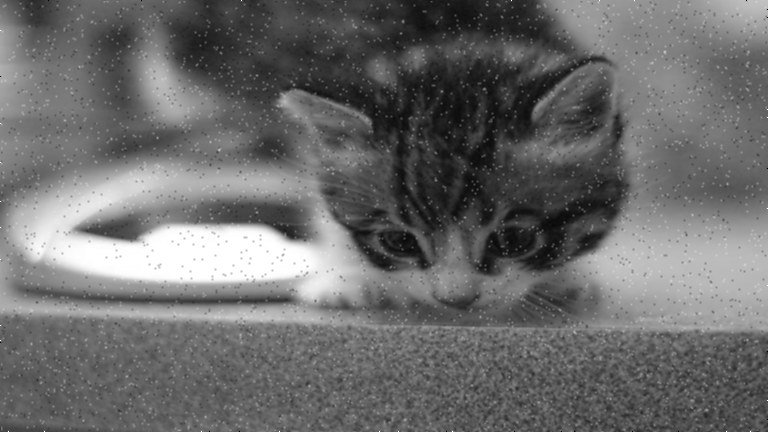

In [ ]:
for i in saltpepper:
  dst=Convolucion(kernel,i)
  cv2_imshow(dst)
  print('\n')

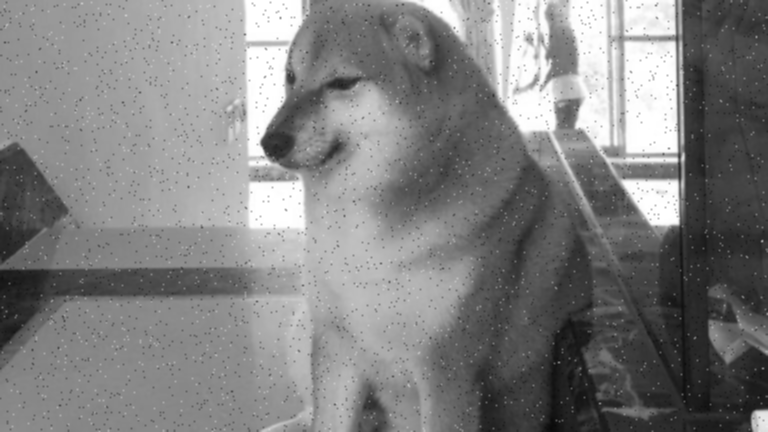

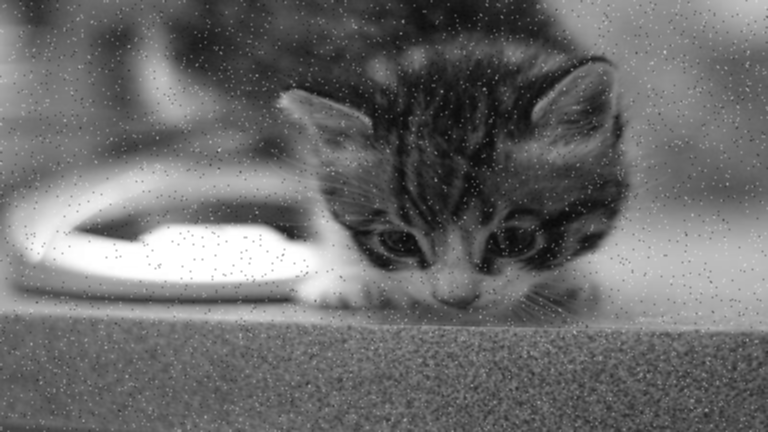

In [ ]:
for i in saltpepper:
  dst=cv.GaussianBlur(i,(kernel.shape[0],kernel.shape[1]),0)
  cv2_imshow(dst)
  print('\n')

# 9. Zoom (Bilinear-Cubica)

Zoom repitiendo valores

In [ ]:
#Repetir valores
def scale(imagen,factor1,factor2):    
    modificado= np.zeros((len(imagen)*factor1,len(imagen[0])*factor2,1),np.uint8)
    
    for i in range(len(imagen)):
        for j in range(len(imagen[i])):
            for k in range(factor1):
                for l in range(factor2):
                    modificado[int(i*factor1+k)][int(j*factor2+l)]=imagen[i][j]
                    
    return modificado

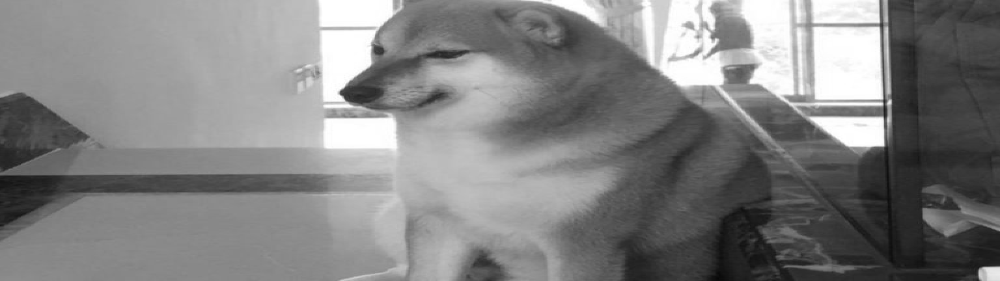

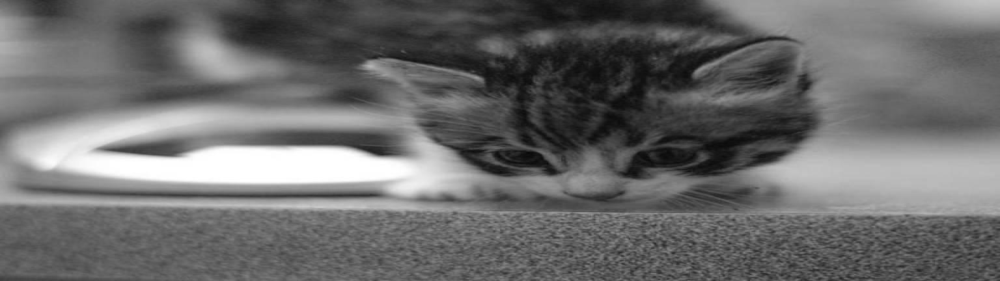

In [ ]:
factor1=2
factor2=3
for i in gray_images:
  dst=scale(i,factor1-1,factor2-1)
  cv2_imshow(dst)
  print('\n')

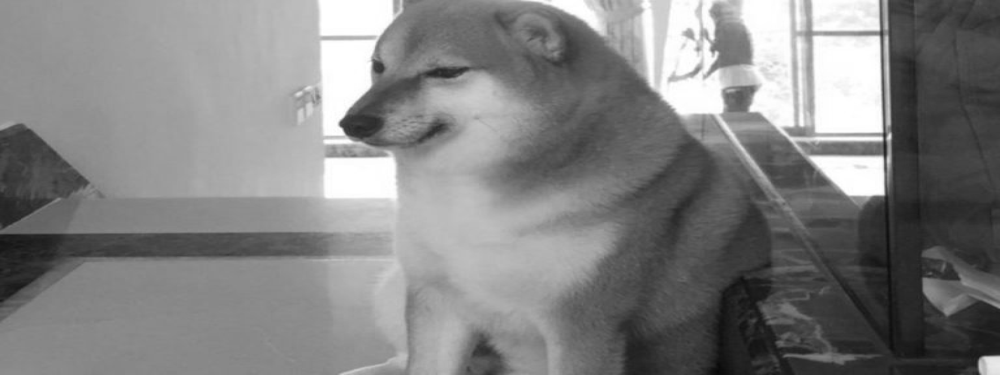

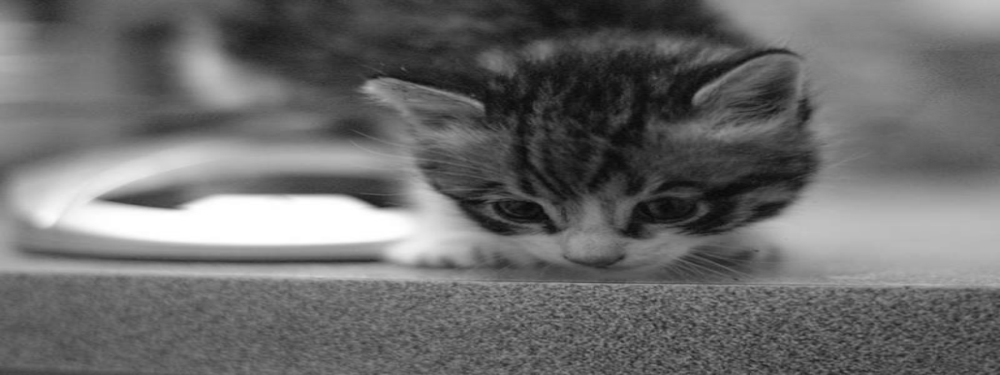

In [ ]:
#con las librerias
for i in gray_images:
  dst=cv.resize(i,(i.shape[1]*factor2,i.shape[0]*factor1), interpolation = cv.INTER_AREA)
  cv2_imshow(dst)
  print('\n')

Zoom interpolacion vecino mas cercano

In [ ]:
def NN_interpolation(img,dstH,dstW):
    scrH,scrW=img.shape
    retimg=np.zeros((dstH,dstW),dtype=np.uint8)
    for i in range(dstH):
        for j in range(dstW):
            scrx=round((i+1)*(scrH/dstH))
            scry=round((j+1)*(scrW/dstW))
            retimg[i,j]=img[scrx-1,scry-1]
    return retimg

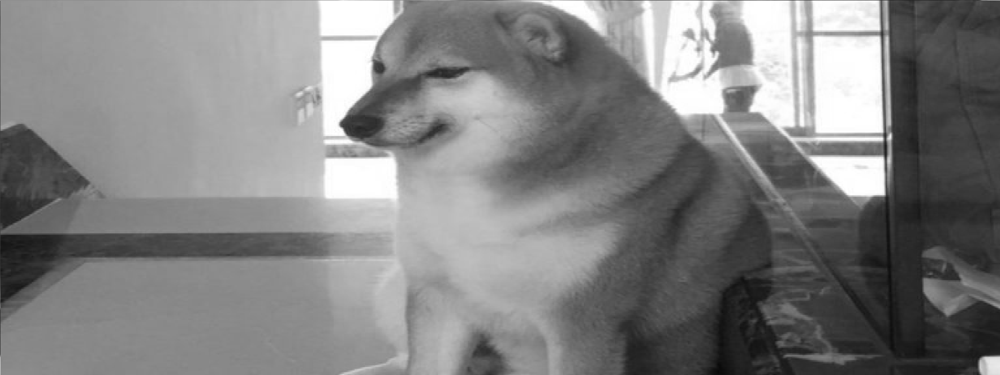

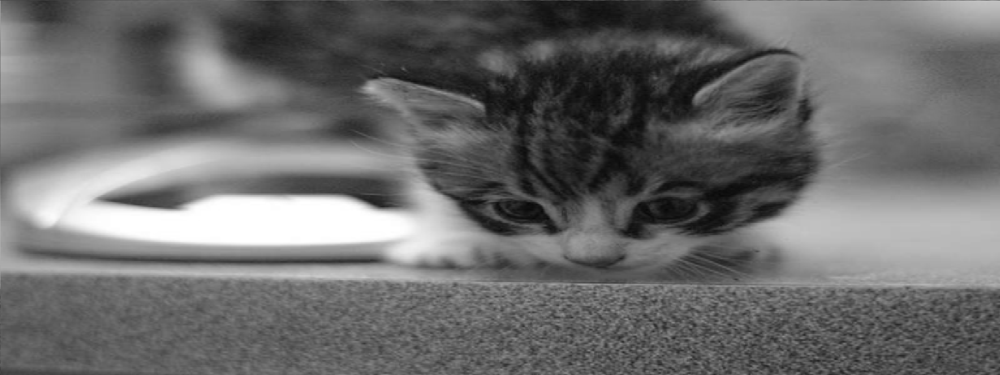

In [ ]:
factor1=2
factor2=3
for i in gray_images:
  dst=NN_interpolation(i,i.shape[0]*factor1,i.shape[1]*factor2)
  cv2_imshow(dst)
  print('\n')

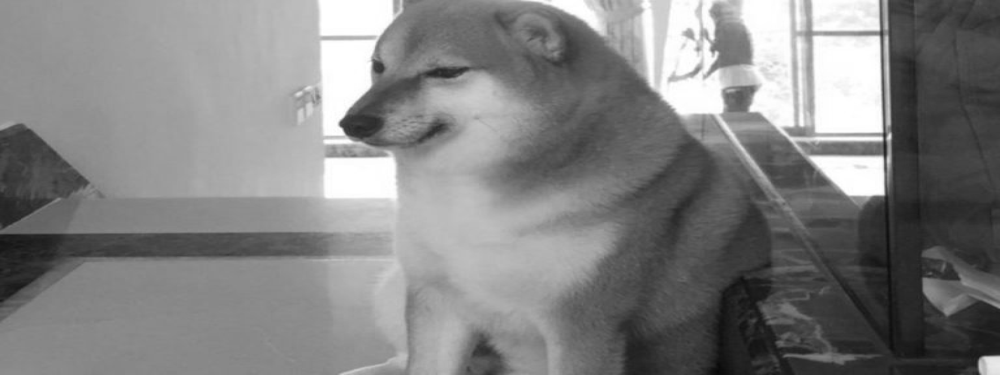

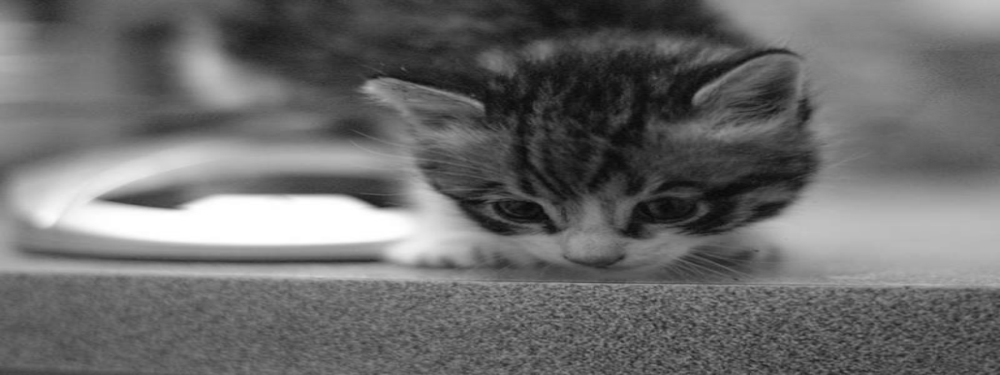

In [ ]:
#con las librerias
for i in gray_images:
  dst=cv.resize(i,(i.shape[1]*factor2,i.shape[0]*factor1), interpolation = cv.INTER_NEAREST)
  cv2_imshow(dst)
  print('\n')

interpolacion bilinear

In [ ]:
def BiLinear_interpolation(img,dstH,dstW):
    scrH,scrW=img.shape
    img=np.pad(img,((0,1),(0,1)),'constant')
    retimg=np.zeros((dstH,dstW),dtype=np.uint8)
    for i in range(dstH):
        for j in range(dstW):
            scrx=(i+1)*(scrH/dstH)-1
            scry=(j+1)*(scrW/dstW)-1
            x=math.floor(scrx)
            y=math.floor(scry)
            u=scrx-x
            v=scry-y
            retimg[i,j]=(1-u)*(1-v)*img[x,y]+u*(1-v)*img[x+1,y]+(1-u)*v*img[x,y+1]+u*v*img[x+1,y+1]
    return retimg

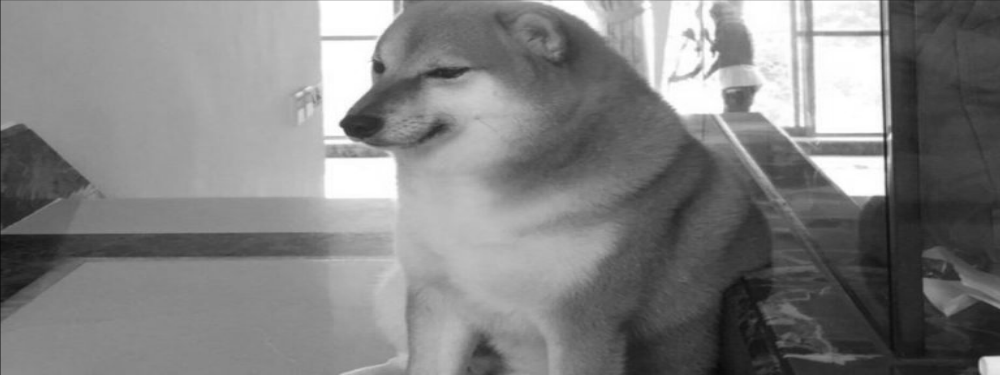

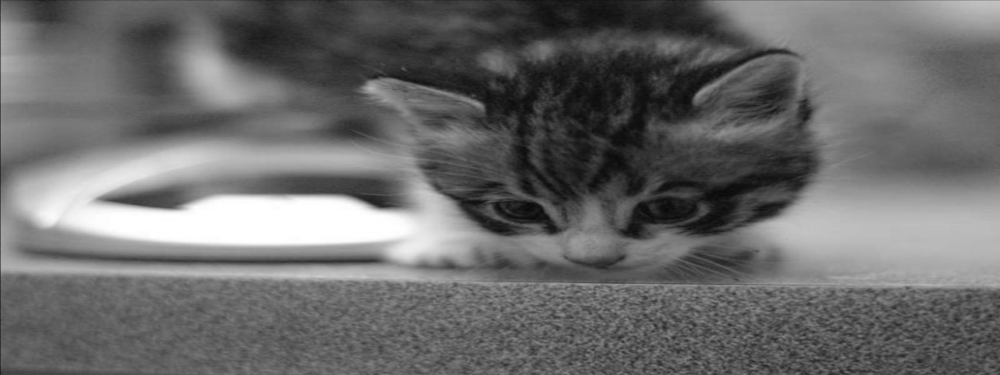

In [ ]:
factor1=2
factor2=3
for i in gray_images:
  dst=BiLinear_interpolation(i,i.shape[0]*factor1,i.shape[1]*factor2)
  cv2_imshow(dst)
  print('\n')

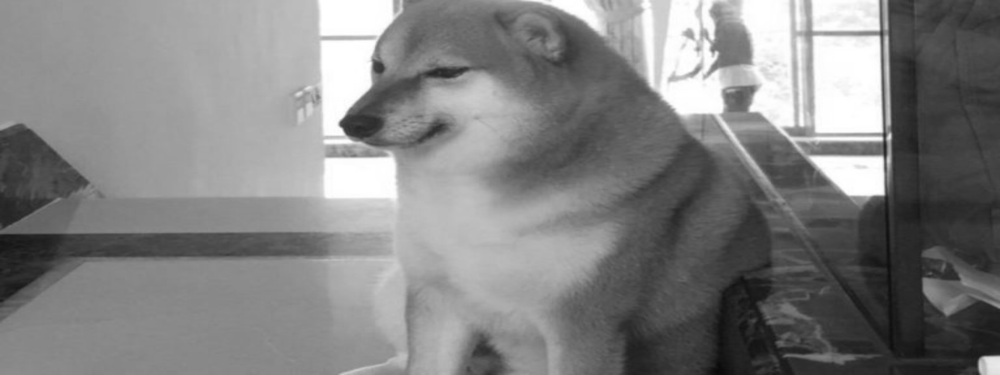

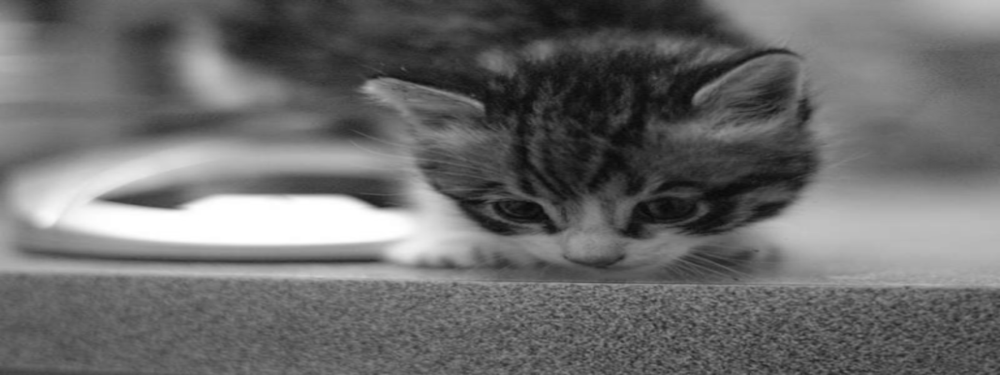

In [ ]:
#con las librerias
for i in gray_images:
  dst=cv.resize(i,(i.shape[1]*factor2,i.shape[0]*factor1), interpolation = cv.INTER_LINEAR)
  cv2_imshow(dst)
  print('\n')

interpolacion bicubica

In [ ]:
def BiBubic(x):
    x=abs(x)
    if x<=1:
        return 1-2*(x**2)+(x**3)
    elif x<2:
        return 4-8*x+5*(x**2)-(x**3)
    else:
        return 0

In [ ]:
def BiCubic_interpolation(img,dstH,dstW):
    scrH,scrW=img.shape
    retimg=np.zeros((dstH,dstW),dtype=np.uint8)
    for i in range(dstH):
        for j in range(dstW):
            scrx=i*(scrH/dstH)
            scry=j*(scrW/dstW)
            x=math.floor(scrx)
            y=math.floor(scry)
            u=scrx-x
            v=scry-y
            tmp=0
            for ii in range(-1,2):
                for jj in range(-1,2):
                    if x+ii<0 or y+jj<0 or x+ii>=scrH or y+jj>=scrW:
                        continue
                    tmp+=img[x+ii,y+jj]*BiBubic(ii-u)*BiBubic(jj-v)
            retimg[i,j]=np.clip(tmp,0,255)
    return retimg

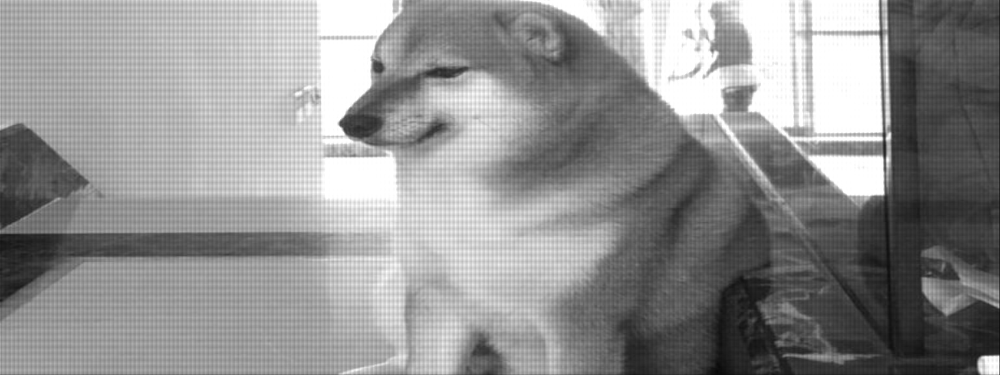

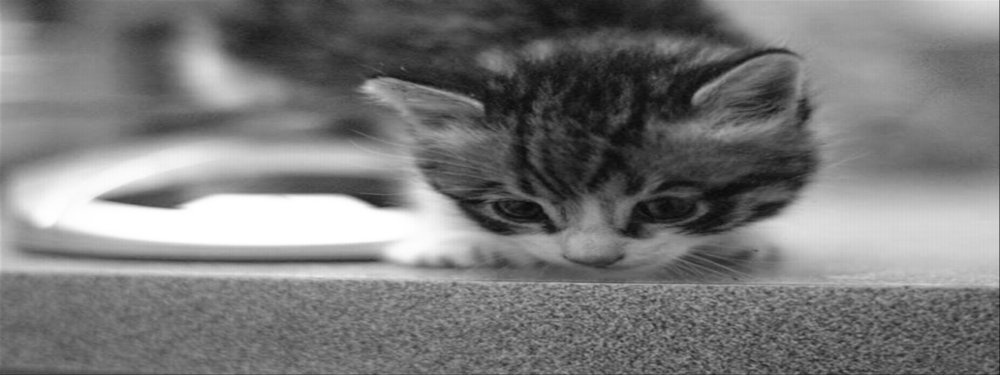

In [ ]:
factor1=2
factor2=3
for i in gray_images:
  dst=BiCubic_interpolation(i,i.shape[0]*factor1,i.shape[1]*factor2)
  cv2_imshow(dst)
  print('\n')

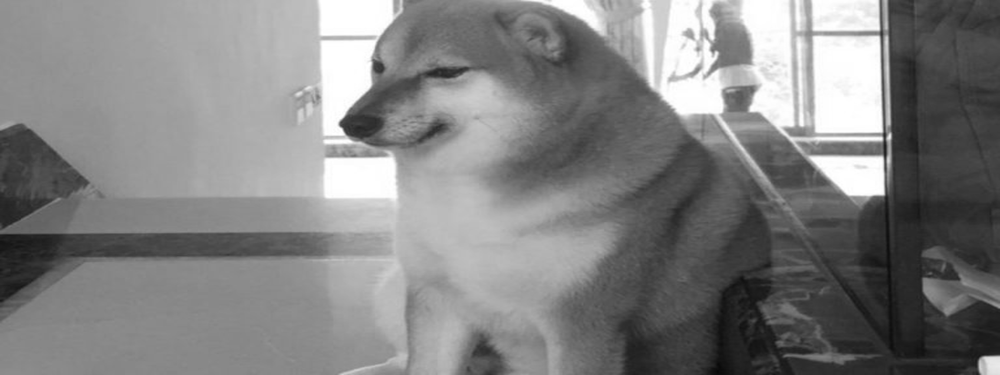

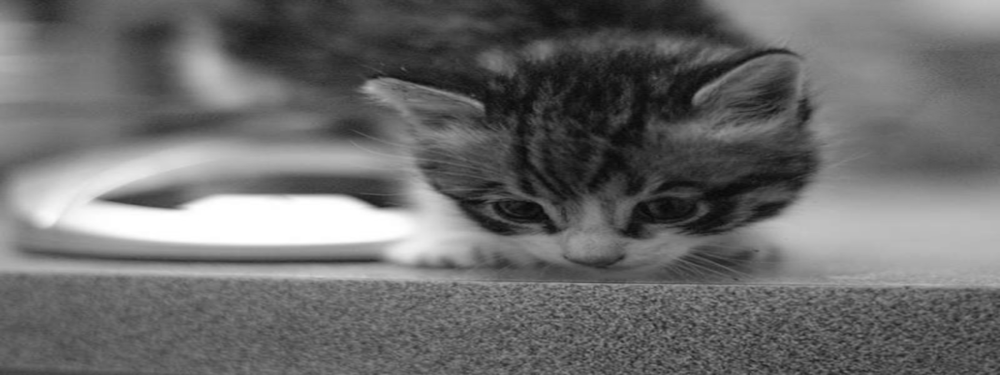

In [ ]:
#con las librerias
for i in gray_images:
  dst=cv.resize(i,(i.shape[1]*factor2,i.shape[0]*factor1), interpolation = cv.INTER_CUBIC)
  cv2_imshow(dst)
  print('\n')